<a href="https://colab.research.google.com/github/SaiMithunPunna/AIDS/blob/main/Understanding_convolution(25_06_25).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
arr=[[1 , 2 ,3, 4] , [5 , 6 , 7 , 8] , [9 , 10 , 11 ,12]]
arr=np.array(arr)
print(arr.shape)
print(arr)
print(arr.reshape(4 , 3))

print(arr.reshape(1 , 3 , 4))
print(arr.reshape(3,2,2))

(3, 4)
[[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]
[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]
[[[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10 11 12]]]
[[[ 1  2]
  [ 3  4]]

 [[ 5  6]
  [ 7  8]]

 [[ 9 10]
  [11 12]]]


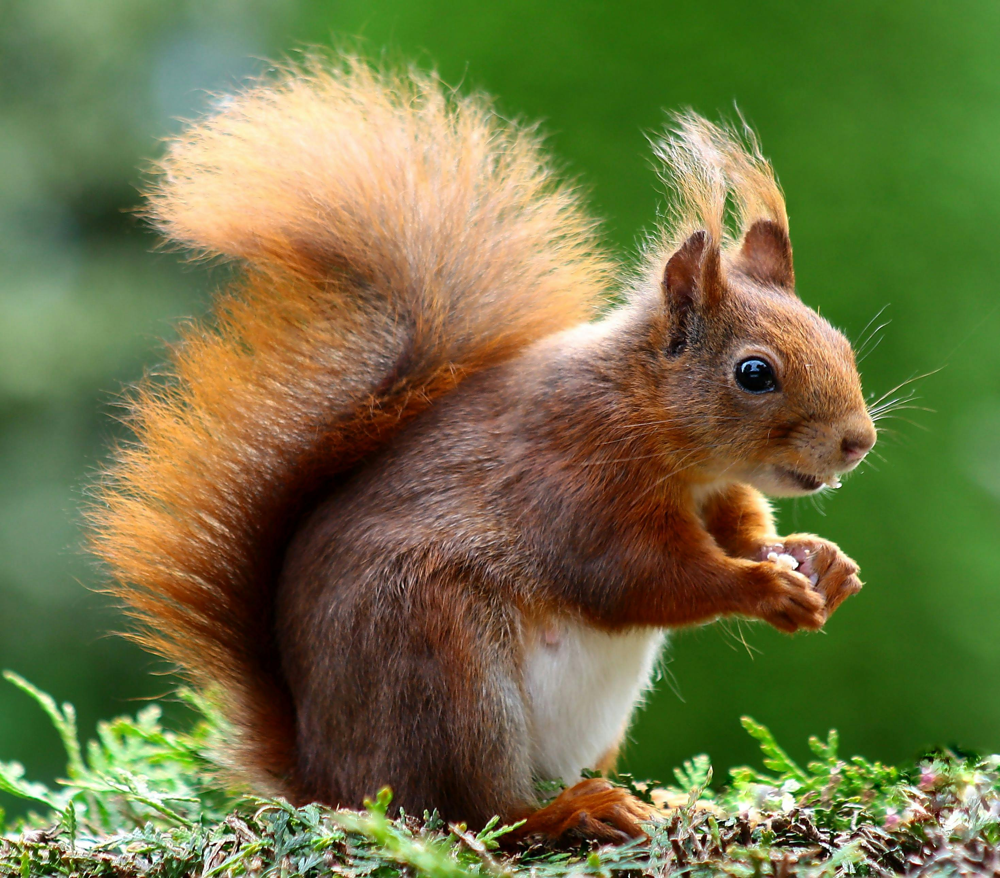

In [ ]:
from google.colab.patches import cv2_imshow
import os , json , cv2 , random

im=cv2.imread("/content/drive/MyDrive/Colab Datasets/Squirrel.jpg")
cv2_imshow(im)



In [ ]:
im.shape

(2583, 2939, 3)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

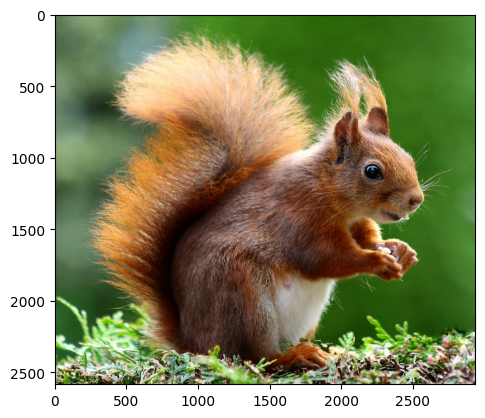

In [ ]:
image=mpimg.imread("/content/drive/MyDrive/Colab Datasets/Squirrel.jpg")
plt.imshow(image)

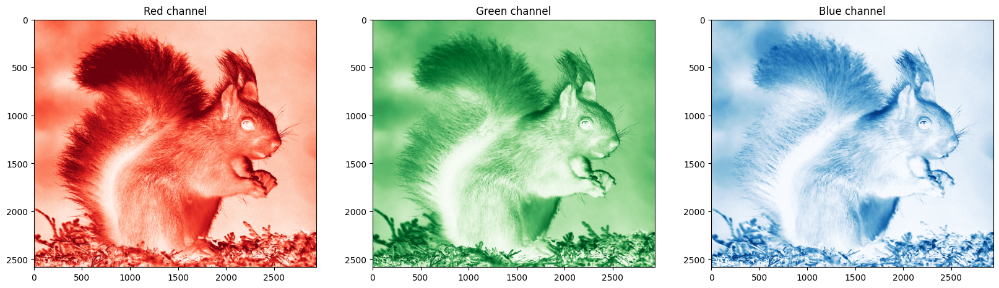

In [ ]:
r=image[:,:,0]
g=image[:,:,1]
b=image[:,:,2]

f , (ax1 , ax2 , ax3)=plt.subplots(1 , 3 , figsize=(20 , 10))
ax1.set_title("Red channel")
ax1.imshow(r , cmap='Reds')
ax2.set_title("Green channel")
ax2.imshow(g , cmap='Greens')
ax3.set_title("Blue channel")
ax3.imshow(b , cmap='Blues')

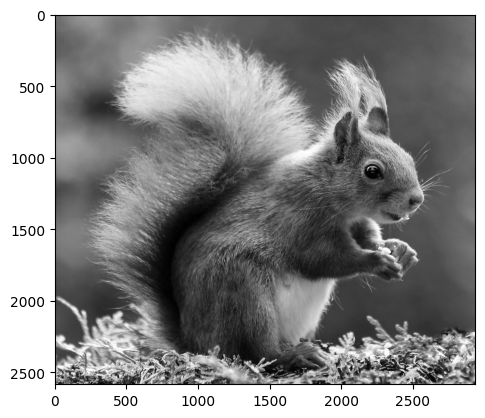

In [ ]:
gray=cv2.cvtColor(image , cv2.COLOR_RGB2GRAY)
plt.imshow(gray , cmap='gray')

In [ ]:
from tensorflow.keras.datasets import mnist
(X_train , y_train ) , (X_test , y_test)=mnist.load_data()
print("The MNIST database has a training set of %d examples."% len(X_train))
print("The MNIST databse has a test set of %d examples."%len(X_test))


The MNIST database has a training set of 60000 examples.
The MNIST databse has a test set of 10000 examples.


In [ ]:
X_train.shape

(60000, 28, 28)

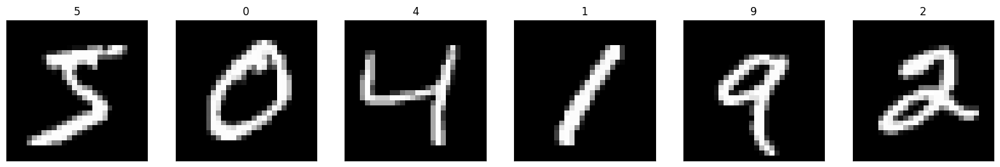

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm
import numpy as np
fig=plt.figure(figsize=(20 ,20))
for i in range(6):
  ax=fig.add_subplot( 1 , 6, i+1 , xticks=[] , yticks=[])
  ax.imshow(X_train[i] , cmap='gray')
  ax.set_title(str(y_train[i]))


In [ ]:
X_train.shape

(60000, 28, 28)

In [ ]:
X_train=X_train.astype('float32')/255
X_test=X_test.astype('float32')/255
print('T=X_train shape:' , X_train.shape)
print(X_train.shape[0] , 'train samples')
print(X_test.shape[0] , 'test samples')

T=X_train shape: (60000, 28, 28)
60000 train samples
10000 test samples


In [ ]:
X_train[0].min()

np.float32(0.0)

In [ ]:
X_train[0].max()

np.float32(1.0)

In [ ]:
np.unique(y_train)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [ ]:
y_train.ndim

1

In [ ]:
from tensorflow.keras.utils import to_categorical
y_train=to_categorical(y_train)
y_test=to_categorical(y_test)

In [ ]:
y_train.shape

(60000, 10)

In [ ]:
img_rows,img_cols =28 , 28
X_train =X_train.reshape(X_train.shape[0] , img_rows , img_cols , 1)
X_test=X_test.reshape(X_test.shape[0] , img_rows , img_cols ,1)
input_shape=(img_rows , img_cols , 1)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D , MaxPooling2D , Flatten , Dense , Dropout
model=Sequential()
model.add(Conv2D(32 , kernel_size=(3,3) , padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(26 , activation='relu'))
model.add(Dense(10 , activation='softmax'))
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.compile(loss='categorical_crossentropy' , optimizer='rmsprop' , metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
checkpointer =ModelCheckpoint(filepath='model.weights.best.keras' , verbose=1 , save_best_only=True)
hist=model.fit(X_train , y_train , batch_size=64 , epochs=1 , validation_data=(X_test , y_test) , callbacks=[checkpointer] , verbose=2 , shuffle=True)
